## 관련 패키지 불러오기

In [1]:
import pandas as pd

In [2]:
import geopandas as gpd

import fiona #공간데이터를 딕셔너리 형태 등으로 접근할 수 있는 라이브러리 
from fiona.crs import from_epsg # 좌표변환 

import pyproj  # 좌표변환
from pyproj import Proj, transform

import shapely
from shapely.geometry.multipolygon import MultiPolygon 
from shapely.geometry import LineString, Point
from shapely import wkt

In [35]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_style('darkgrid') #whitegrid, dark, white, ticks
mpl.rc('font', family='NanumGothic') #한글 폰트 적용시
plt.rcParams["figure.figsize"] = (15,10) #차트 사이즈

In [64]:
import geoplot as gplt
import geoplot.crs as gcrs

import folium
#import mapclassify as mc
import contextily as ctx  #conda install contextily 또는 pip install contextily
import cartopy

## 데이터

### 행정구역 공간데이터

In [4]:
#깃허브의 해당 파일 download 버튼 URL 확인 
geojson_sido2 = 'https://github.com/vuski/admdongkor/raw/8e737c267b9006e1e71ca09853c2355d0b452906/ver20201001/HangJeongDong_ver20201001.geojson'

In [5]:
# geojson을 geopandas의 geoDataFrame으로 변환
gdf_sido2 = gpd.read_file(geojson_sido2)
print(gdf_sido2.crs, '\n')
gdf_sido2.info()
gdf_sido2.head()

{'init': 'epsg:4326'} 

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3492 entries, 0 to 3491
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  3492 non-null   int64   
 1   adm_nm    3492 non-null   object  
 2   adm_cd    3492 non-null   object  
 3   adm_cd2   3492 non-null   object  
 4   sgg       3492 non-null   object  
 5   sido      3492 non-null   object  
 6   sidonm    3492 non-null   object  
 7   sggnm     3492 non-null   object  
 8   geometry  3492 non-null   geometry
dtypes: geometry(1), int64(1), object(7)
memory usage: 245.7+ KB


,OBJECTID,adm_nm,adm_cd,adm_cd2,sgg,sido,sidonm,sggnm,geometry
0,1,서울특별시 종로구 사직동,1101053,1111053000,11110,11,서울특별시,종로구,"MULTIPOLYGON (((126.97689 37.57565, 126.97703 ..."
1,2,서울특별시 종로구 삼청동,1101054,1111054000,11110,11,서울특별시,종로구,"MULTIPOLYGON (((126.98269 37.59507, 126.98337 ..."
2,3,서울특별시 종로구 부암동,1101055,1111055000,11110,11,서울특별시,종로구,"MULTIPOLYGON (((126.97585 37.59656, 126.97359 ..."
3,4,서울특별시 종로구 평창동,1101056,1111056000,11110,11,서울특별시,종로구,"MULTIPOLYGON (((126.97507 37.63139, 126.97649 ..."
4,5,서울특별시 종로구 무악동,1101057,1111057000,11110,11,서울특별시,종로구,"MULTIPOLYGON (((126.96067 37.58080, 126.96281 ..."


In [6]:
# 행정구역에서 서울만 추출
gdf_sido3 = gdf_sido2[ gdf_sido2['sido'] == '11' ]
gdf_sido3.crs

{'init': 'epsg:4326'}

<AxesSubplot:>

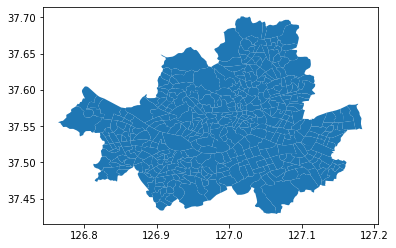

In [7]:
gdf_sido3.plot()

In [8]:
# 좌표계 변환
gdf_sido3_3857 = gdf_sido3.to_crs(epsg=3857) 

C:\Users\dhl\anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


### CCTV 포인트 공간데이터

In [9]:
# shp 로딩
gdf_cctv_sl03 = gpd.read_file('./data/gdf_cctv_sl03.shp', encoding='utf-8')  #euc-kr, euckr, utf-8, cp949 중 선택
gdf_cctv_sl03.crs  #좌표계 확인용 

{'init': 'epsg:4326'}

In [40]:
# Dataframe you want to plot
gdf_cctv_sl03_3857 = gdf_cctv_sl03.to_crs(epsg=3857) # reproject it in Web mercator
# Geometry를 이용하여 X, Y 좌표 항목을 생성 
gdf_cctv_sl03_3857["x"] = gdf_cctv_sl03_3857.geometry.x
gdf_cctv_sl03_3857["y"] = gdf_cctv_sl03_3857.geometry.y
gdf_cctv_sl03_3857.head()

C:\Users\dhl\anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,admin_nm,addr_rd,addr_jb,purpose,cctv_cnt,pixel,direction,period,date_insta,tel,...,offer_ad_1,sl,zscore_lon,outliers,zscore_lat,geometry,year,year2,x,y
0,서울특별시 영등포구,"선유로13길 25,서울영문초등학교 사거리앞",선유로13길 25,생활방범,3,None,360도 전방면,30,2018-08,02-2670-4067,...,서울특별시 영등포구,0,-1.348028,0,-0.950876,POINT (14124991.821 4511747.327),2018,2018,1.412499e+07,4.511747e+06
1,서울특별시 영등포구,"문래로4길 4,현대2차APT 202동 옆 서부간선도로 사잇길 육교앞",문래로4길 4,생활방범,2,None,360도 전방면,30,2018-08,02-2670-4067,...,서울특별시 영등포구,0,-1.406838,0,-0.937394,POINT (14124451.882 4511863.040),2018,2018,1.412445e+07,4.511863e+06
2,서울특별시 영등포구,"선유로9나길 22,사거리앞",문래동5가 12 사거리앞,생활방범,3,None,360도 전방면,30,2018-08,02-2670-4067,...,서울특별시 영등포구,0,-1.358297,0,-1.007738,POINT (14124897.547 4511259.295),2018,2018,1.412490e+07,4.511259e+06
3,서울특별시 영등포구,경인로94길 9-13,문래동1가 2-6,생활방범,3,None,360도 전방면,30,2018-08,02-2670-4067,...,서울특별시 영등포구,0,-1.145901,0,-1.030685,POINT (14126847.579 4511062.359),2018,2018,1.412685e+07,4.511062e+06
4,서울특별시 영등포구,"선유서로 31,현대6차APT 602동 근처 창대교회 사거리앞",문래동6가 55-1 현대6차APT 602동 근처 창대감리교회 사거리앞,생활방범,1,None,360도 전방면,30,2018-08,02-2670-4067,...,서울특별시 영등포구,0,-1.392190,0,-0.957706,POINT (14124586.369 4511688.705),2018,2018,1.412459e+07,4.511689e+06


C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  after removing the cwd from sys.path.
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  after removing the cwd from sys.path.


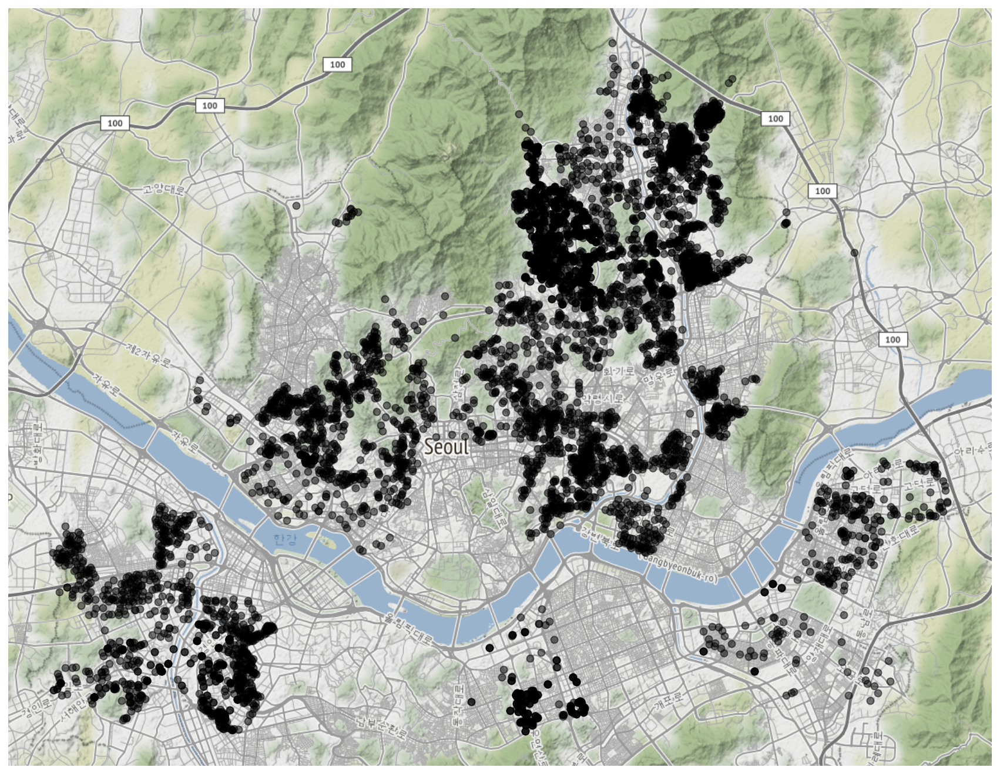

In [96]:
ax = gdf_cctv_sl03_3857.plot(figsize=(15, 15), color='black', alpha=0.5)

# choose any of the supported maps from ctx.sources
ctx.add_basemap(ax, url=ctx.sources.ST_TERRAIN)
ax.set_axis_off()
plt.show()

### 배경맵
http://maps.stamen.com/#toner/13/37.5500/126.9996

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\dhl\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  inframe=inframe)


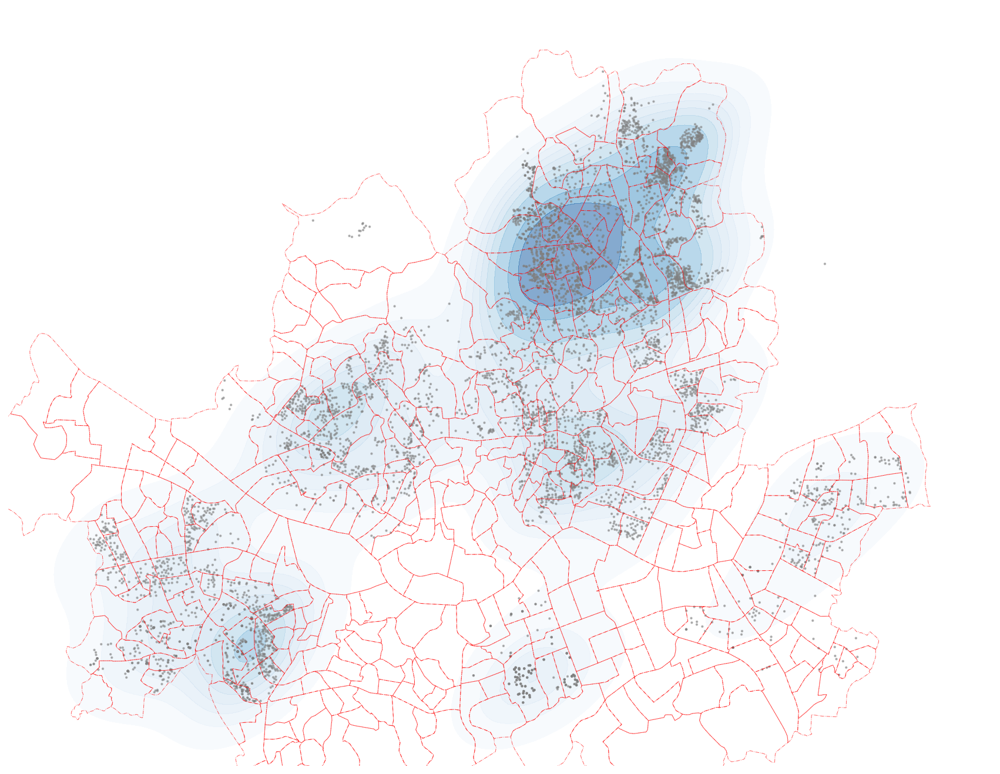

In [99]:
ax = gplt.polyplot(gdf_sido3, facecolor='none', edgecolor='red', linestyle='-.', linewidth=0.5, alpha=0.6, zorder=1, projection=gcrs.WebMercator(), figsize=(15, 15))  
gplt.kdeplot(gdf_cctv_sl03, cmap='Blues', shade=True, alpha=0.5, ax=ax)
gplt.pointplot(gdf_cctv_sl03, s=1.2, color='gray', alpha=0.5, ax=ax)
#gplt.webmap(gdf_cctv_sl03, provider=ctx.sources.ST_TONER_LITE, ax=ax, extent=gdf_sido3.total_bounds) 

fig = plt.gcf()
#plt.savefig("./image/heatmap01.png", bbox_inches='tight', pad_inches=0)

#### KDE(Kernel Density Estimation) 란?
https://en.wikipedia.org/wiki/Kernel_density_estimation

http://blog.naver.com/PostView.nhn?blogId=cjh226&logNo=221362816850&parentCategoryNo=&categoryNo=17&viewDate=&isShowPopularPosts=false&from=postView 


## Animation Heatmap
연도별로 CCTV가 주로 설치된 지역을 시각화해보자 

#### 연도 전처리

In [12]:
gdf_cctv_sl03['date_insta'] = gdf_cctv_sl03['date_insta'].str.replace(pat='Mar-16', repl= '2016-03', regex=True)
gdf_cctv_sl03['date_insta'] = gdf_cctv_sl03['date_insta'].str.replace(pat='Aug-16', repl= '2016-08', regex=True)
gdf_cctv_sl03['date_insta'] = gdf_cctv_sl03['date_insta'].str.replace(pat='May-16', repl= '2016-05', regex=True)
gdf_cctv_sl03['date_insta'] = gdf_cctv_sl03['date_insta'].str.replace(pat='Jun-16', repl= '2016-06', regex=True)
gdf_cctv_sl03['date_insta'] = gdf_cctv_sl03['date_insta'].str.replace(pat='Oct-16', repl= '2016-10', regex=True)

In [13]:
# 설치년도가 없는 데이터 삭제
gdf_cctv_sl03.dropna(subset=['date_insta'],axis=0,inplace=True)

In [14]:
gdf_cctv_sl03['year'] = gdf_cctv_sl03['date_insta'].str[:4] #앞 4자리 문자열만 추출

In [15]:
# 연도 항목을 정수형으로 변환
gdf_cctv_sl03['year2'] = gdf_cctv_sl03['year'].astype(int)

#### 연도별 kdeplot 이미지 저장   
image 폴더 아래에 heatmap이라는 폴더를 미리 만들어 주세요~  

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\dhl\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  inframe=inframe)


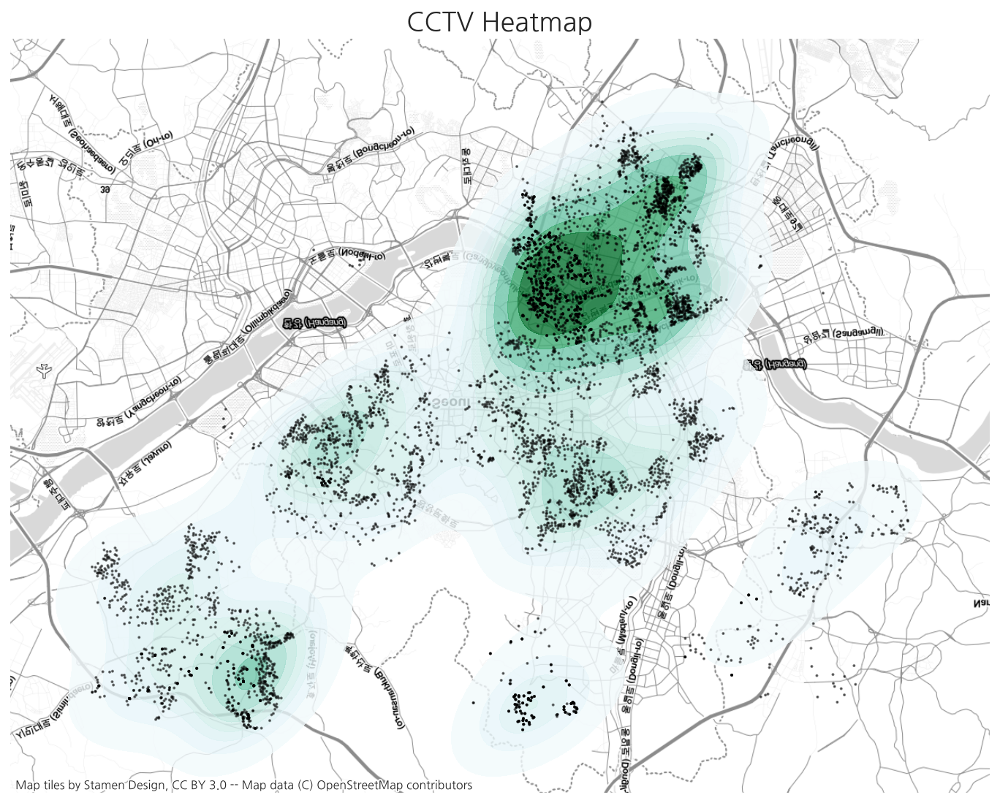

In [102]:
ax = gplt.kdeplot(gdf_cctv_sl03, cmap='BuGn', projection=gcrs.WebMercator(), 
                  figsize=(12, 12), shade=True, alpha=0.8)
gplt.pointplot(gdf_cctv_sl03, s=1, color='black', alpha=0.5, ax=ax)
gplt.webmap(gdf_cctv_sl03, ax=ax, provider=ctx.sources.ST_TONER_LITE)  #url=ctx.sources.ST_TONER_LITE\
plt.title('CCTV Heatmap', fontsize=18)
fig = plt.gcf()
#plt.savefig("./image/heatmap/CCTV_Heatmap.png") #, bbox_inches='tight', pad_inches=0.01)

### Seaborn의 kdeplot 응용  
https://seaborn.pydata.org/generated/seaborn.kdeplot.html  

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'figsize'
  **contour_kws,
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until


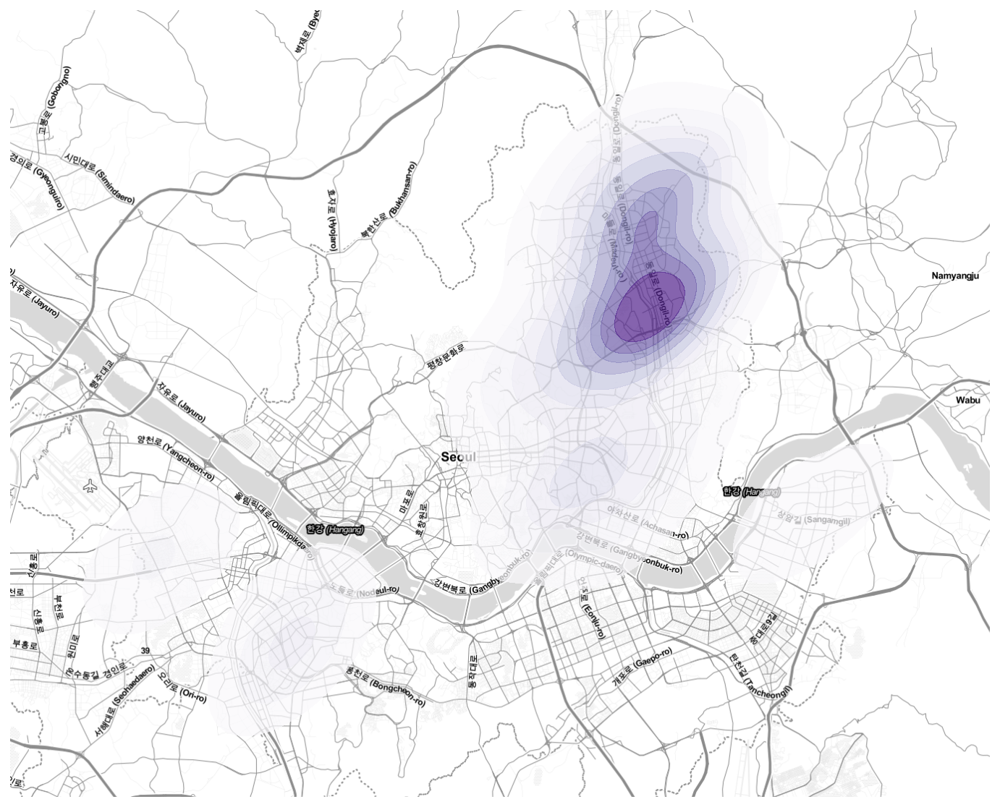

In [46]:
# 2015년 
ax = sns.kdeplot(data=gdf_cctv_sl03_3857[gdf_cctv_sl03_3857['year2'] == 2015], x="x", y="y", cmap='Purples', alpha=0.7, fill=True, figsize=(15, 15))
ctx.add_basemap(ax, url=ctx.sources.ST_TONER_LITE)
ax.set_axis_off()
plt.title('CCTV Heatmap - 2015년', fontsize=18)
#fig = plt.gcf()
plt.savefig("./image/heatmap/heatmap_2015.png", bbox_inches='tight', pad_inches=0.01)
plt.show()

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'figsize'
  **contour_kws,
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until


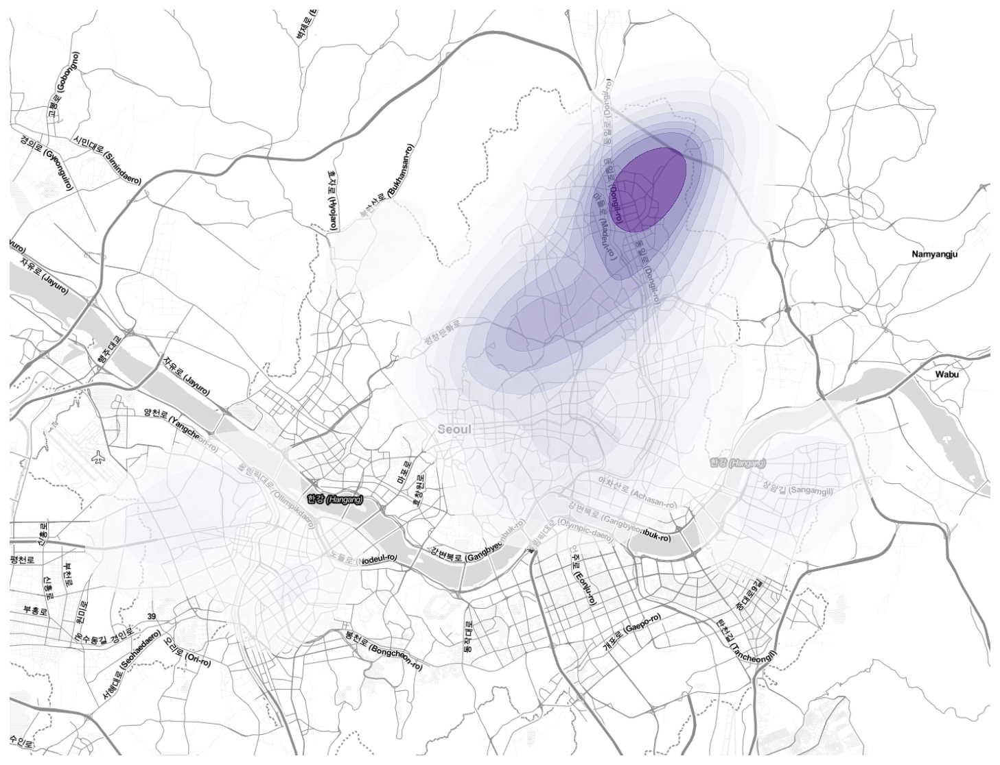

In [56]:
# 2016년 
ax = sns.kdeplot(data=gdf_cctv_sl03_3857[gdf_cctv_sl03_3857['year2'] == 2016], x="x", y="y", cmap='Purples', alpha=0.7, fill=True, figsize=(15, 15))
ctx.add_basemap(ax, url=ctx.sources.ST_TONER_LITE)
ax.set_axis_off()
plt.title('CCTV Heatmap - 2016년', fontsize=18)
plt.savefig("./image/heatmap/heatmap_2016.png", bbox_inches='tight', pad_inches=0.01)

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'figsize'
  **contour_kws,
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until


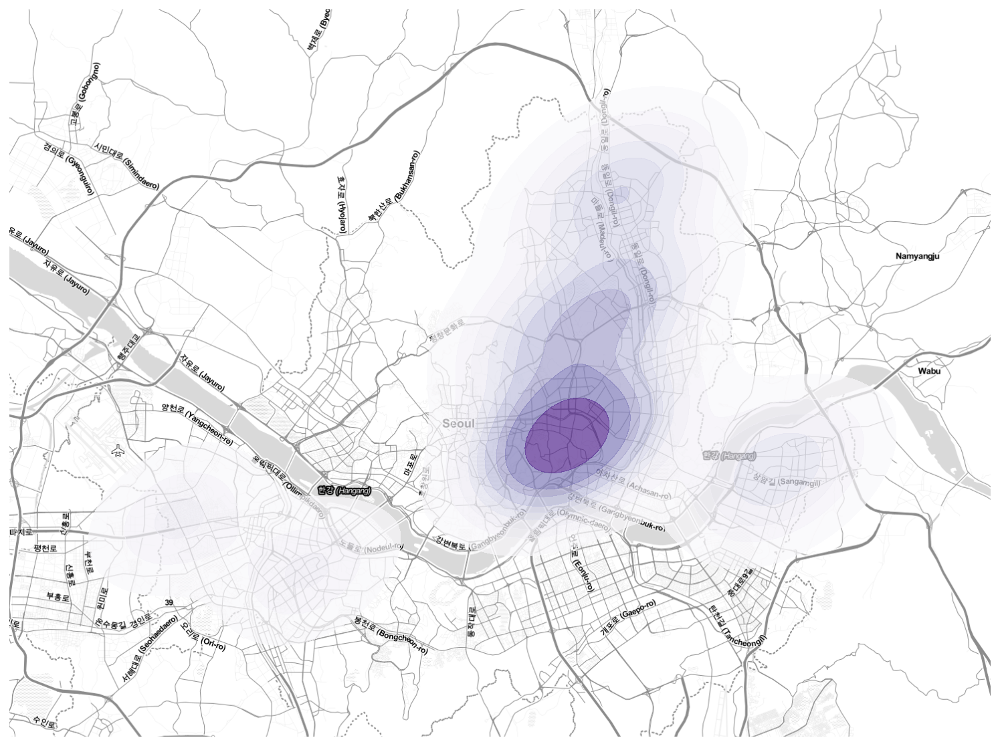

In [57]:
# 2017년 
ax = sns.kdeplot(data=gdf_cctv_sl03_3857[gdf_cctv_sl03_3857['year2'] == 2017], x="x", y="y", cmap='Purples', alpha=0.7, fill=True, figsize=(15, 15))
ctx.add_basemap(ax, url=ctx.sources.ST_TONER_LITE)
ax.set_axis_off()
plt.title('CCTV Heatmap - 2017년', fontsize=18)
plt.savefig("./image/heatmap/heatmap_2017.png", bbox_inches='tight', pad_inches=0.01)

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'figsize'
  **contour_kws,
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until


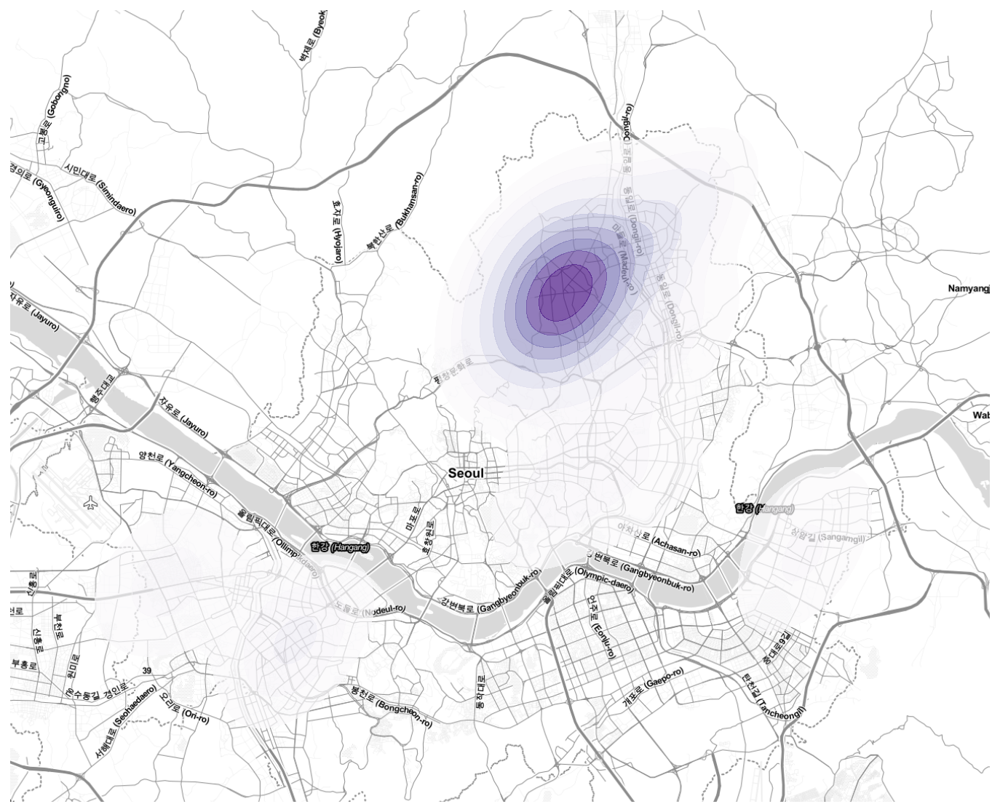

In [58]:
# 2018년 
ax = sns.kdeplot(data=gdf_cctv_sl03_3857[gdf_cctv_sl03_3857['year2'] == 2018], x="x", y="y", cmap='Purples', alpha=0.7, fill=True, figsize=(15, 15))
ctx.add_basemap(ax, url=ctx.sources.ST_TONER_LITE)
ax.set_axis_off()
plt.title('CCTV Heatmap - 2018년', fontsize=18)
plt.savefig("./image/heatmap/heatmap_2018.png", bbox_inches='tight', pad_inches=0.01)

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'figsize'
  **contour_kws,
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until


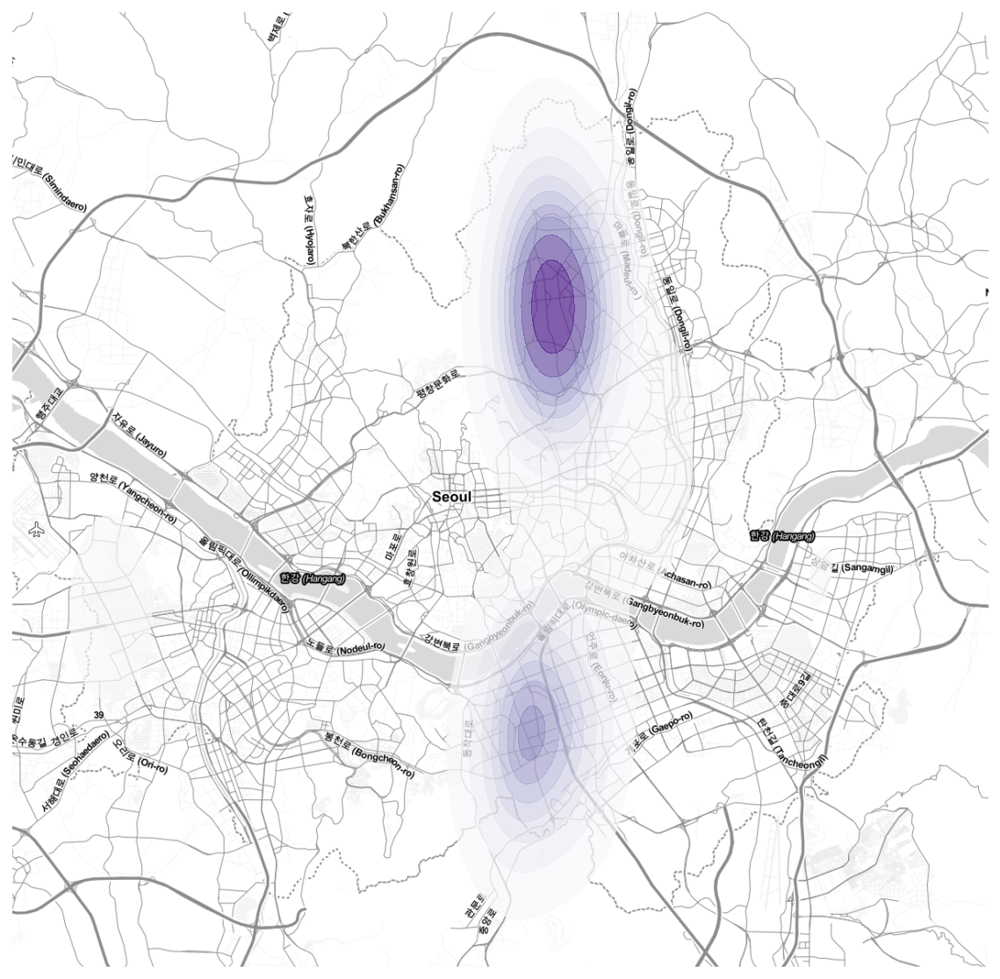

In [59]:
# 2019년 
ax = sns.kdeplot(data=gdf_cctv_sl03_3857[gdf_cctv_sl03_3857['year2'] == 2019], x="x", y="y", cmap='Purples', alpha=0.7, fill=True, figsize=(15, 15))
ctx.add_basemap(ax, url=ctx.sources.ST_TONER_LITE)
ax.set_axis_off()
plt.title('CCTV Heatmap - 2019년', fontsize=18)
plt.savefig("./image/heatmap/heatmap_2019.png", bbox_inches='tight', pad_inches=0.01)

C:\Users\dhl\anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'figsize'
  **contour_kws,
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\dhl\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until


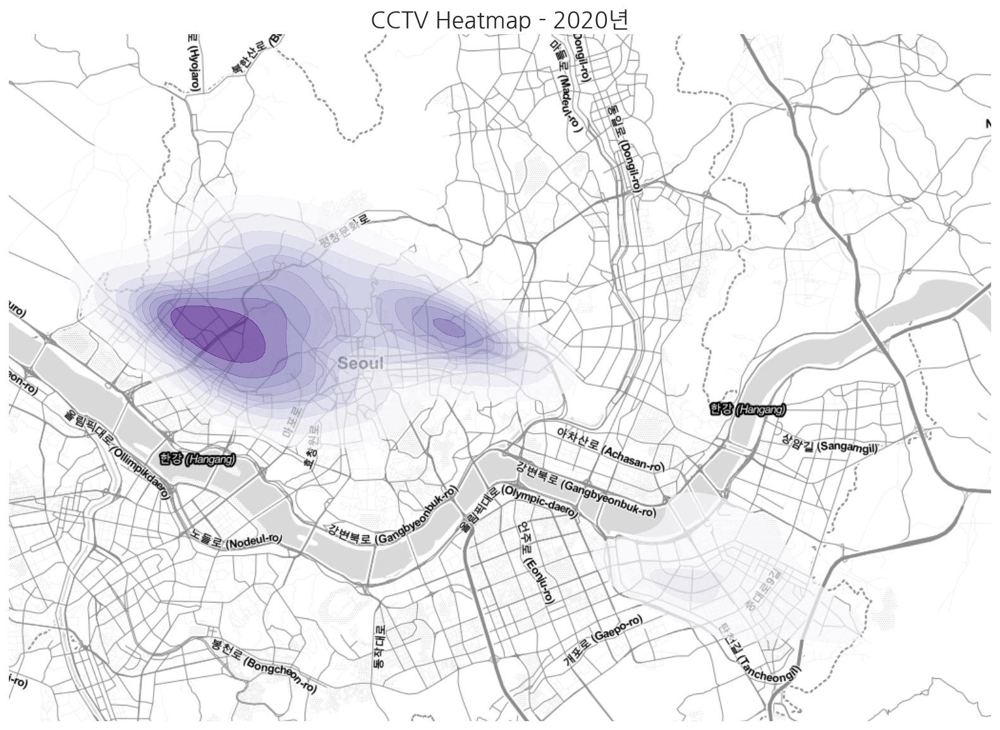

In [92]:
# 2020년 
ax = sns.kdeplot(data=gdf_cctv_sl03_3857[gdf_cctv_sl03_3857['year2'] == 2020], x="x", y="y", cmap='Purples', alpha=0.7, fill=True, figsize=(15, 15))
ctx.add_basemap(ax, url=ctx.sources.ST_TONER_LITE)
ax.set_axis_off()
plt.title('CCTV Heatmap - 2020년', fontsize=18)
plt.savefig("./image/heatmap/heatmap_2020.png", bbox_inches='tight', pad_inches=0.01)

#### 만들어진 연도별 이미지 파일들을 GIF로 생성

In [61]:
from pathlib import Path
import imageio    #!pip install imageio

In [62]:
image_path = Path('./image/heatmap') #특정 폴더/경로 지정
images = list(image_path.glob('*.png'))  #해당 경로의 특정 포맷에 대한 (이미지) 파일명 리스트 생성
image_list = []   
for file_name in images:  #Animated GIF 생성용 리스트에 추가
    image_list.append(imageio.imread(file_name))

In [63]:
# Animated GIF 생성 
imageio.mimwrite('./image/heatmap/cctv_heatmap.gif', image_list, fps=0.5, loop=True ) #fps는 초 단위

#### 지명을 이용하여 배경지도 위치를 고정

<AxesSubplot:xlabel='X', ylabel='Y'>

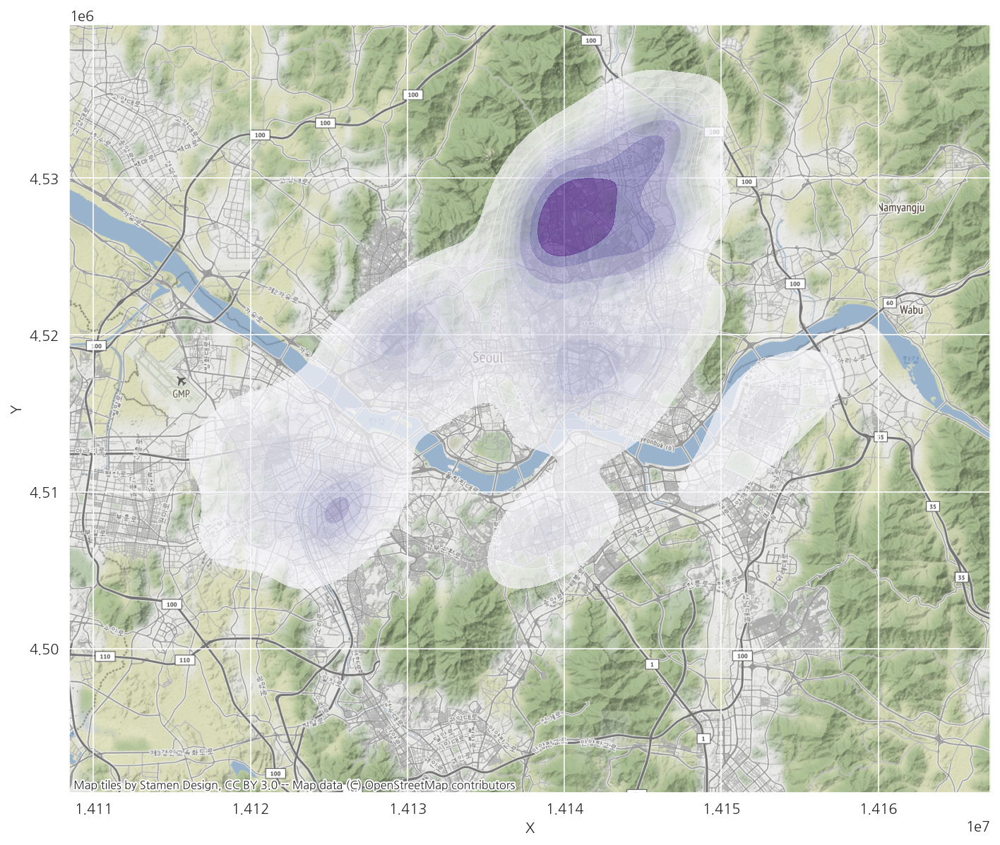

In [77]:
lvl = ctx.Place('Seoul') #, url=ctx.sources.ST_TONER_LITE)
ax = sns.kdeplot(data=gdf_cctv_sl03_3857, x="x", y="y", cmap='Purples', alpha=0.7, fill=True)
lvl.plot(ax)